# Проект: "Исследование рынка заведений общественного питания Москвы"

**Цель проекта: подготовить аналитическое исследование заведений общественного питания Москвы для инвесторов, чтобы они смогли принять решение о том, какого типа заведение и в каком районе города будет наиболее перспективным.**

**Данные для аналитического кейса представлены датасетом `moscow_places.csv`, содержащим информацию об имеющихся на лето 2022 года заведениях общепита Москвы:**

`name` — название;

`address` — адрес;

`category` — категория заведения («кафе», «пиццерия», «кофейня» и др.);

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

    "Средний счёт: 1000–1500 ₽";
    
    "Цена чашки капучино: 130–220 ₽";
    
    "Цена бокала пива: 400–600 ₽".

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки "Средний счёт";

`middle_coffee_cup` — число с оценкой стоимости одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки "Цена одной чашки капучино";

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (1 - сетевое, 0 - не сетевое), для маленьких сетей могут встречаться ошибки;

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

**План выполения проекта:**

**1. Загрузить данные и выполнить их первичный просмотр.**

**2. Выполнить предобработку данных (пропуски, дубликаты).**

       2.1. Создать дополнительный столбец `street` с названиями улиц, на которых расположены заведения.
    
       2.2. Создать дополнительный столбец `is_24\7` с обозначением, что заведение работает ежедневно и круглосуточно 
    (True - если ежедневное и круглосуточное, False - если нет).

**3. Выполнить исследовательский анализ данных, ответив на следующие вопросы:**

       3.1. Какие категории заведений присутствуют в датасете? Как распределены заведения по категориям?
   
       3.2. Как распределено количество посадочных мест в заведениях по категориям?
   
       3.3. Каково соотношение сетевых и несетевых заведений в датасете?
   
       3.4. Какие категории заведений чаще являются сетевыми?
   
       3.5. Каковы топ-15 самых популярных сетевых заведений?
   
       3.6. Какие административные районы Москвы присутствуют в датасете? Каково общее количество заведений и количество заведений в каждой категории по районам?
   
       3.7. Каково распределение средних рейтингов по категориям заведений? Сильно ли различаются средние рейтинги в разных типах общепита?
   
       3.8. Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района, взяв данные о границах районов из файла `admin_level_geomap.geojson`
   
       3.9. Используя кластеры библиотеки `folium`, отобразить все заведения из датасета на карте.
   
       3.10. Найти топ-15 улиц по количеству заведений. Построить график распределения количества заведений и их категорий по улицам.
   
       3.11. Найти улицы, на которых есть только один объект общепита. Что это за заведения?
   
       3.12. Найти медиану среднего чека заведений для каждого района как ценовой индикатор района. Построить хороплет  полученными значениями для каждого района. Проанализировать, как удаленность от центра влияет на цены в заведениях?
   
       3.13. Проанализировать иные взаимосвязи в данных. Например, часы работы заведений и их зависимость от расположения и категории заведения.
       
       3.14. Сделать общий вывод по выполненному исследовательскому анализу.

**4. Детализировать исследование под открытие кофейни, дав ответы на вопросы:**

       4.1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
   
       4.2. Есть ли круглосуточные кофейни?
   
       4.3. Какие у кофеен рейтинги? Как они распределяются по районам?
   
       4.4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
   
       4.5. Расширить анализ ответами на собственные вопросы. На основе полученных результатов дать рекомендации по открытию кофейни.
   
**5. Подготовить презентацию в формате PDF, выбрав важные тезисы и наблюдения, которые могут заинтересовать заказчиков. Приложить ссылку на презентацию в markdown-ячейке.**

## Загрузка и первичный просмотр данных

**В начале установим библиотеку `haversine`, которая поможет в вычислении расстояний между географическими точками:**

In [1]:
!pip install haversine


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


**Импортируем необходимые для работы библиотеки:**

In [2]:
import pandas as pd
import requests
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import haversine as hs

import urllib.request, json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [3]:
sns.set_palette("tab10")
sns.set_style("whitegrid")

**Записываем данные в датафрейм `df`:**

In [4]:
df = pd.read_csv('moscow_places.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**В датасете данные о 8406 объектах общественного питания. Имеются полные данные о категориях, адресах и районах расположения заведений, их координатах, рейтинге и о том, является ли заведение сетевым. Не для всх заведений указаны часы работы, категория цен, диапазон среднего счета, средний счет, средняя стоимость чашки каппучино и количество посадочных мест.**

**Названия столбцов и форматы данных не вызывают нареканий**

In [6]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Предварительная обработка данных

### Проверка на наличие дубликатов

**Сначала проверим, есть ли в данных полные дубликаты:**

In [7]:
df.duplicated().sum()

0

**Полностью дублирующихся строчек нет. Теперь посмотрим как обстоит дело с неявными дубликатами. Начнем со столбца `category`**:

In [8]:
def unique_values(column):
    print(df[column].sort_values(ascending=True).unique())

In [9]:
unique_values('category')

['бар,паб' 'булочная' 'быстрое питание' 'кафе' 'кофейня' 'пиццерия'
 'ресторан' 'столовая']


**В этом столбце все в порядке - неявных дубликатов нет. Теперь посмотрим на столбец с районами:**

In [10]:
unique_values('district')

['Восточный административный округ' 'Западный административный округ'
 'Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Центральный административный округ'
 'Юго-Восточный административный округ'
 'Юго-Западный административный округ' 'Южный административный округ']


**Взглянем на категории цен:**

In [11]:
unique_values('price')

['высокие' 'выше среднего' 'низкие' 'средние' nan]


**Неявных дубликатов нет, но есть пропущенные значения. Наконец, обратимся к столбцу `chain`, содержащему информацию о том, является ли заведение сетевым:**

In [12]:
unique_values('chain')

[0 1]


**Проверим, нет ли дубликатов по сочетаниям имя-категория-адрес и имя-адрес, предварительно приведя все столбцы к нижнему регистру. Создадим в датафрейме `df` временный столбец `is_duplicated`, в который запишем, является ли строка дубликатом другой строки по сочетанию имя-категория-адрес:**

In [13]:
df['is_duplicated'] = df[['name', 'category', 'address']].apply(lambda x: x.astype(str).str.lower()).duplicated()

**Выведем строки-дубликаты:**

In [14]:
df.query('is_duplicated')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,True
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,True


**Удалим из датафрейма `df` такие строки:**

In [15]:
df = df.drop(index=[215,1511]).reset_index(drop=True)

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8404 entries, 0 to 8403
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8404 non-null   object 
 1   category           8404 non-null   object 
 2   address            8404 non-null   object 
 3   district           8404 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8404 non-null   float64
 6   lng                8404 non-null   float64
 7   rating             8404 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8404 non-null   int64  
 13  seats              4794 non-null   float64
 14  is_duplicated      8404 non-null   bool   
dtypes: bool(1), float64(6), int64(1), object(7)
memory usage: 927.5+ KB


In [17]:
df[['name', 'category', 'address']].apply(lambda x: x.astype(str).str.lower()).duplicated().sum()

0

**Отлично. Строчек в датафрейме стало на две меньше, дубликаты по сочетанию имя-категория-адрес пропали.**

### Работа с пропусками в данных

**Мы выяснили, что пропуски в данных присутствуют для столбцов с часами работы `hours`, категорией цен `price`, диапазоном среднего счета `avg_bill`, средним счетом `middle_avg_bill`, средней стоимостью чашки капучино `middle_coffee_cup` и количеством посадочных мест `seats`. Посмотрим, какие доли значений пропущены в каждом из столбцов датафрейма:**

In [18]:
pd.DataFrame(round(df.isna().mean()*100,1)).style.background_gradient('bwr')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


**Больше всего пропусков в столбцах, касающихся цен и среднего чека (`price` - 60.6%, `avg_bill` - 54.6%, `middle_avg_bill` - 62.5% и `middle_coffee_cup` - 93.6%). Также пропущено 43% значений в столбце с количеством посадочных мест `seats`.**

**Пропущенное число посадочных мест будет сложно заполнить, поскольку оно зависит как от типа заведения, так и от площади помещения, в котором располагается заведение, а такой информации у нас нет. Поэтому в столбце `seats` пропущенные значения числовыми значениями заменять не будем.**
**Ценовая категория и средний счет также очень вариативные показатели. Даже рестораны/кафе одной и той же сети могут иметь одну ценовую категорию в центральных районах, и другую на окраинах. Средний счет также зависит от географического положения места и от особенностей городской среды вокруг - например, если рядом есть крупное предприятие или офисный комплекс, это может сильно изменять величину среднего чека. Поэтому, чтобы избежать искажений данных, не будем заменять пропуски и в этих полях какими-либо числовыми значениями.** 

**Вместе с тем, когда мы будем оценивать распределение заведений по ценовым категориям и среднему чеку по районам, неплохо иметь представление о том, какая доля заведений в каждом районе не имеет ценовой категории, оценки среднего чека и числа посадочных мест. Поэтому создадим отдельный датафрейм `df_dummy` - копию датафрейма `df`, в которой вместо пропущенных значений в столбцах `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats` будет стоять "заглушка" `unknown`:**

In [19]:
df_dummy = df.fillna('unknown')

In [20]:
df_dummy

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,unknown,unknown,0,unknown,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,unknown,0,4.0,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,unknown,0,45.0,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,unknown,170.0,0,unknown,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,unknown,1,148.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8399,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,unknown,unknown,unknown,unknown,0,86.0,False
8400,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,unknown,unknown,unknown,unknown,0,150.0,False
8401,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,unknown,Средний счёт:от 150 ₽,150.0,unknown,0,150.0,False
8402,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,unknown,unknown,unknown,unknown,1,150.0,False


### Создание столбца с названием улиц

**Посмотрим, как выглядят информация об адресах заведений общепита:**

In [21]:
df['address']

0                       Москва, улица Дыбенко, 7/1
1               Москва, улица Дыбенко, 36, корп. 1
2                   Москва, Клязьминская улица, 15
3              Москва, улица Маршала Федоренко, 12
4                  Москва, Правобережная улица, 1Б
                           ...                    
8399                 Москва, Профсоюзная улица, 56
8400    Москва, Пролетарский проспект, 19, корп. 1
8401        Москва, Люблинская улица, 112А, стр. 1
8402        Москва, Люблинская улица, 112А, стр. 1
8403                Москва, Россошанский проезд, 6
Name: address, Length: 8404, dtype: object

**На первом месте всегда название города - Москва, затем запятая, пробел и название улицы/проспекта/проезда, запятая и информация о конкретном доме на данной улице. Создадим функцию `street_name`, которая будет из столбца с адресом извлекать только название улицы:**

In [22]:
def street_name(dataframe):
    str_name = dataframe['address'][7:] #убираем слово Москва, запятую и пробел
    while ',' in str_name: #создаем цикл, в которм пока есть запятые в адресе "откусываем" от него по одному символу с конца
        str_name = str_name[:-1] 
    return str_name

**Применим эту функцию к датафрейму `df` - создадим в нем дополнительный столбец `street` с названием улицы:**

In [23]:
df['street'] = df.apply(street_name, axis=1)
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False,Правобережная улица


In [24]:
street_names = df['street'].sort_values().unique()

In [25]:
df['street'].sort_values().head(100)

6330     1-й Автозаводский проезд
1331      1-й Балтийский переулок
7188        1-й Варшавский проезд
6495      1-й Вешняковский проезд
1269     1-й Волоколамский проезд
                  ...            
736        1-я Останкинская улица
834        1-я Останкинская улица
2331       1-я Останкинская улица
2372       1-я Останкинская улица
2548       1-я Останкинская улица
Name: street, Length: 100, dtype: object

**Ту же самую операцию проделаем для датафрейма `df_dummy`:**

In [26]:
df_dummy['street'] = df_dummy.apply(street_name, axis=1)
df_dummy.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,unknown,unknown,0,unknown,False,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,unknown,0,4.0,False,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,unknown,0,45.0,False,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,unknown,170.0,0,unknown,False,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,unknown,1,148.0,False,Правобережная улица


### Создание столбца с обозначением ежедневного круглосуточного режима работы

**Посмотрим как данные о режиме работы представлены в датафрейме:**

In [27]:
df['hours']

0                                  ежедневно, 10:00–22:00
1                                  ежедневно, 10:00–22:00
2       пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                                  ежедневно, 09:00–22:00
4                                  ежедневно, 10:00–22:00
                              ...                        
8399                               ежедневно, 09:00–02:00
8400                               ежедневно, 08:00–22:00
8401                             ежедневно, круглосуточно
8402                             ежедневно, круглосуточно
8403                             ежедневно, круглосуточно
Name: hours, Length: 8404, dtype: object

**Ежедневный круглосуточный режим работы обозначен как "ежедневно, круглосуточно". Создадим в датафрейме новый столбец `is_24/7` в который запишем `True` если заведение работает круглосуточно и без выходных, и `False` - если в режиме работы есть перерывы:**

In [28]:
df['is_24/7'] = df['hours'] == 'ежедневно, круглосуточно'
df[['hours', 'is_24/7']]

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8399,"ежедневно, 09:00–02:00",False
8400,"ежедневно, 08:00–22:00",False
8401,"ежедневно, круглосуточно",True
8402,"ежедневно, круглосуточно",True


**Получилось. То же самое сделаем для `df_dummy`:**

In [29]:
df_dummy['is_24/7'] = df_dummy['hours'] == 'ежедневно, круглосуточно'
df_dummy[['hours', 'is_24/7']]

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8399,"ежедневно, 09:00–02:00",False
8400,"ежедневно, 08:00–22:00",False
8401,"ежедневно, круглосуточно",True
8402,"ежедневно, круглосуточно",True


**В итоге предобработки данных количество строк в датафрейме `df` уменьшилось на две из-за удаления двух дублирующихся строк, пропуски не заполнялись, а число столбцов увеличилось на два - `street` и `24/7`. Также был создан отдельный датафрейм `df_dummy`, в котором пропуски были заменены строкой `unknown`.**

## Исследовательский анализ данных

### Распределение заведений Московского общепита по категориям

In [30]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False,Правобережная улица,False


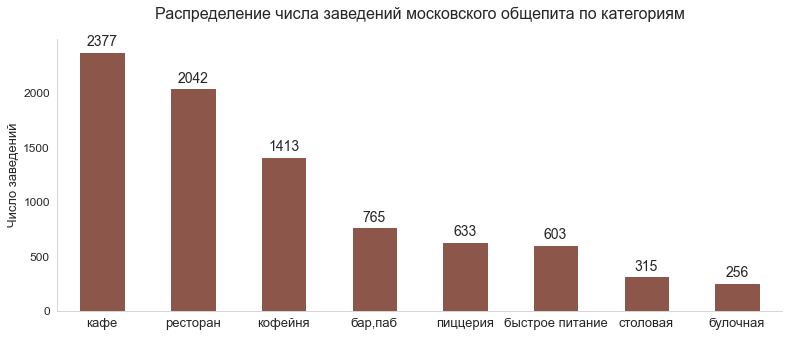

In [31]:
ax = df.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False).plot(kind='bar', figsize=(13,5), grid=False, legend=False, color='#8c564b')
plt.title('Распределение числа заведений московского общепита по категориям', fontsize=16, pad=20)
plt.xticks(rotation=0, fontsize=13)
plt.xlabel('')
plt.yticks(fontsize=12)
plt.ylabel('Число заведений', fontsize=13)
for p in ax.patches:
    ax.annotate(text = np.round(p.get_height(), decimals=1),
                xy = (p.get_x()+p.get_width()/2., p.get_height()),
                ha = 'center',
                va = 'center',
                xytext = (0, 10),
                textcoords = 'offset points',
                fontsize = 14)
sns.despine()
#plt.savefig("categories.jpg", format="jpg", dpi=200)
plt.show()

**Самыми многочисленными заведениями общественного питания в Москве являются кафе и рестораны - 2378 и 2043, соответственно. На третьем месте кофейни - 1413 заведений. Баров - 765, пиццерий - 633, заведений быстрого питания - 603, столовых - 315, булочных - 256. Похоже, в Москве не любят булочки.**

### Количество посадочных мест в заведениях разных категорий

**При работе с количеством посадочных мест необходимо помнить, что эта информация указана только для 57% заведений из датасета. Посмотрим, достаточно ли у нас данных о посадочных местах по каждой категории:**

In [32]:
df.query('~seats.isna()').pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False)

,name
category,
ресторан,1269
кафе,1218
кофейня,751
"бар,паб",468
пиццерия,427
быстрое питание,349
столовая,164
булочная,148


**Даже в самых немногочисленных категорях мы имеем выборку как минимум в полторы сотни значений. Этого вполне достаточно, чтобы оценить среднее или медиану по категориям** 

**Для начала посмотрим на распределения количества посадочных мест в каждой категории:**  

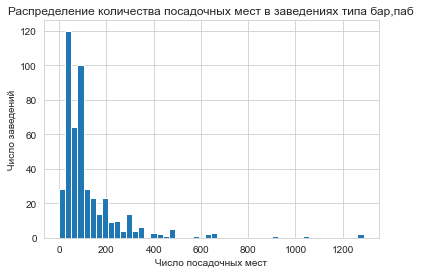

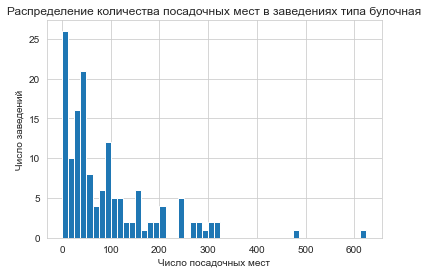

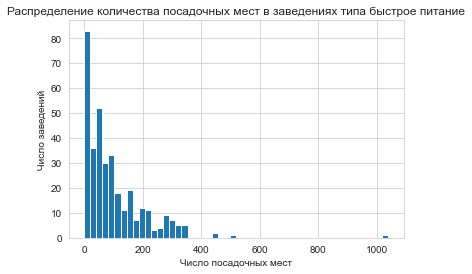

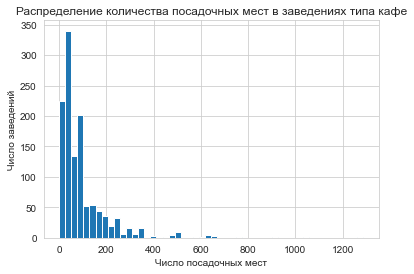

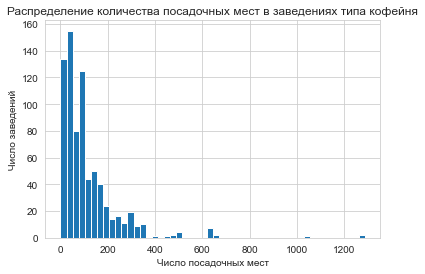

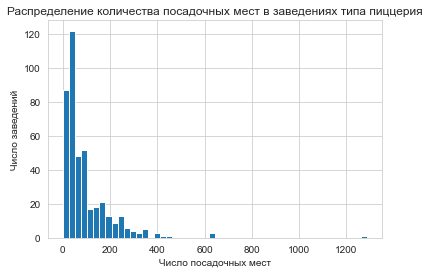

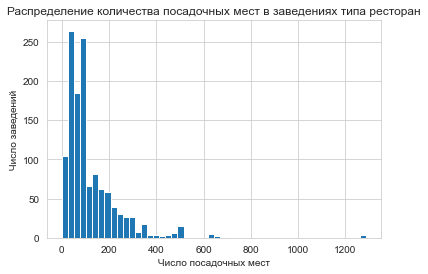

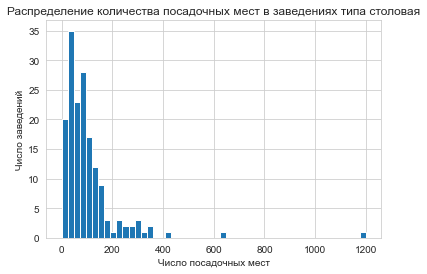

In [33]:
for category in df.sort_values(by='category')['category'].unique():
    df.query('category == @category')['seats'].hist(bins=50)
    plt.title(f'Распределение количества посадочных мест в заведениях типа {category}')
    plt.xlabel('Число посадочных мест')
    plt.ylabel('Число заведений')
    plt.show()

**Видно, что распределения асимметричные, присутствуют выраженные выбросы - заведения, в которых более 1000 посадочных мест. Лучше характеризовать такие распределения медианными значениями.**

**Построим боксплоты, на которых покажем данные о медианном числе посадочных мест по категориям заведений. Сразу выберем диапазон возможных значений числа посадочных мест так, чтобы были видны различия между разными типами заведений:**

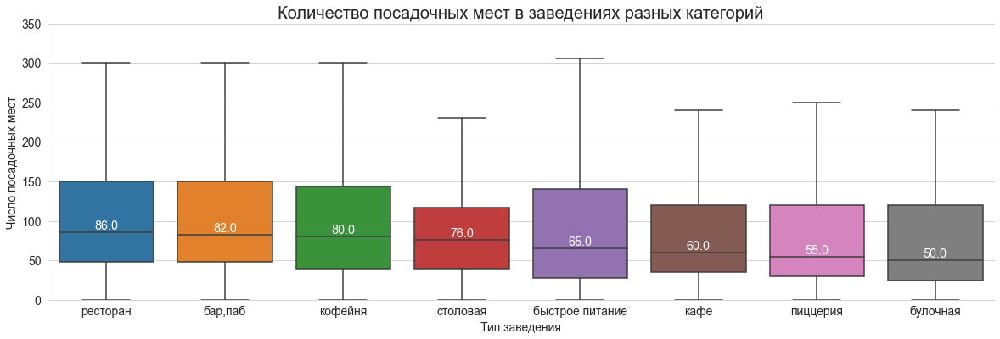

In [34]:
fig, ax = plt.subplots(figsize=(20, 6))
ranks = df.groupby('category')['seats'].median().fillna(0).sort_values()[::-1].index
ax = sns.boxplot(x='category', y='seats', data=df.sort_values(by='category'), order=ranks, showfliers=False)
plt.title('Количество посадочных мест в заведениях разных категорий', fontsize=20)
plt.xlabel('Тип заведения', fontsize=14)
plt.ylabel('Число посадочных мест', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylim(0,350)
medians = round(df.groupby(['category'])['seats'].median().fillna(0).sort_values()[::-1])
vertical_offset = df['seats'].median() * 0.05 

for xtick in ax.get_xticks():
    ax.text(xtick,medians[xtick]+vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-large',color='w')
sns.despine()    
plt.show()

**Самое большое медианное число посадочных мест в ресторанах (86), барах (82) и кофейнях (80). Затем следуют столовые (76), заведения быстрого питания (65), кафе (60), пиццерии (55) и булочные (50). В целом, можно сказать, что различия в количестве посадочных мест между категориями заведений не слишком велики. Можно заметить, что в барах, заведениях быстрого питания, кофейнях и ресторанах число посадочных мест в 75% заведений находится в пределах 150, а в булочных, кафе, пиццериях и столовых - в пределах 120.** 

### Соотношение сетевых и несетевых заведений в датасете

**Посчитаем сколько сетевых и несетевых заведений в датасете:**

In [35]:
chain_pivot = df.pivot_table(index='chain', values='name', aggfunc='count')
chain_pivot.columns=['count']
chain_pivot.index=['несетевые', 'сетевые']
chain_pivot

,count
несетевые,5200
сетевые,3204


**Построим круговую диаграмму:**

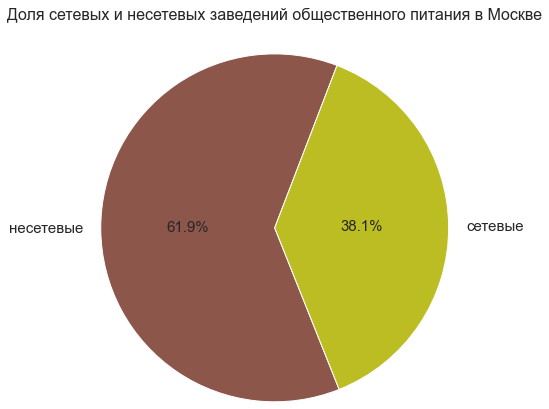

In [36]:
colors = ['#8c564b', '#bcbd22']
plt.pie(chain_pivot['count'], labels=chain_pivot.index, autopct='%1.1f%%', colors=colors, radius=2.0, pctdistance=0.5, labeldistance=1.1, textprops={'fontsize': 15}, startangle = 69)
plt.title('Доля сетевых и несетевых заведений общественного питания в Москве',fontsize=16, pad=100)
#plt.savefig("chain_share.jpg", format="jpg", bbox_inches='tight', dpi=200)
plt.show()

**Доля несетевых заведений составляет 61.9%, сетевых - 38.1%**

### Какие категории заведений чаще являются сетевыми?

In [37]:
pivot_chain_2 = df.query('chain == 1').pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False)
pivot_chain_2

,name
category,
кафе,779
ресторан,729
кофейня,720
пиццерия,330
быстрое питание,232
"бар,паб",169
булочная,157
столовая,88


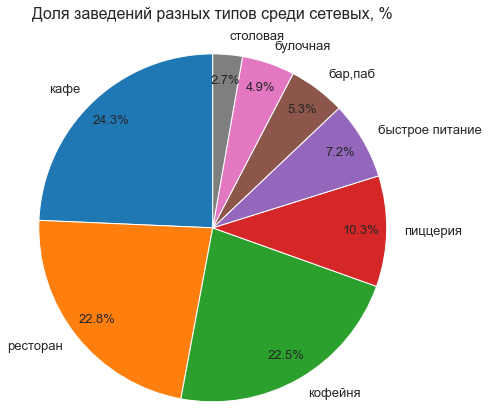

In [38]:
plt.pie(pivot_chain_2['name'], labels=pivot_chain_2.index, autopct='%1.1f%%', radius=2.0, pctdistance=0.85, labeldistance=1.1, textprops={'fontsize': 13}, startangle = 90)
plt.title('Доля заведений разных типов среди сетевых, %', fontsize=16, pad=100)
plt.show()

**Самую большую долю сетевых заведений составляют кафе - 24.3% (779 точек). На втором и третьем местах с практически одинаковыми долями рестораны - 22.8% (730 заведений) и кофейни - 22.5% (720 заведений). Пиццерии, точки быстрого питания, бары, булочные и столовые в сумме составляют около 1/3 всех сетевых заведений (30.4%)**

**Теперь посмотрим какой процент заведений в каждой категории является сетевым:**

In [39]:
chain_percent = round(df.pivot_table(index='category', values='chain', aggfunc='mean').sort_values(by='chain', ascending=False)*100,1).reset_index()
chain_percent

,category,chain
0,булочная,61.3
1,пиццерия,52.1
2,кофейня,51.0
3,быстрое питание,38.5
4,ресторан,35.7
5,кафе,32.8
6,столовая,27.9
7,"бар,паб",22.1


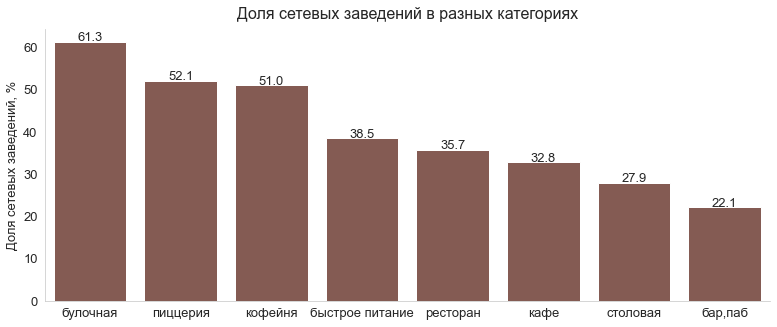

In [40]:
fig, ax = plt.subplots(figsize=(13,5))
ax = sns.barplot(x='category', y='chain', data=chain_percent, color='#8c564b')
ax.grid(False)
plt.title('Доля сетевых заведений в разных категориях', fontsize=16, pad=10)
plt.xticks(rotation=0, fontsize=13)
plt.xlabel('', fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('Доля сетевых заведений, %', fontsize=13)
sns.despine()
for i, v in enumerate(chain_percent['chain']):
   ax.text(i, v + 0.2, str(v), ha='center',fontsize=13)
plt.savefig("chain_categories.jpg", format="jpg", bbox_inches='tight', dpi=200)
plt.show()

**Несмотря на то, что в абсолютном выражении булочные и пиццерии составляют малую часть всех сетевых заведений московского общепита, 61.3% булочных и 52.1% пиццерий - сетевые заведения. На третьем месте по доле сетевых заведений кофейни (51%). Реже всего сетевыми бывают бары/пабы (22.1% заведений).** 

### Топ-15 популярных сетей общепита в Москве

**Создадим сводную таблицу по сетевым заведениям. В качестве индексов будут названия заведений, а в качестве значений - количество заведений с таким названием:**

In [41]:
pivot_chain_3 = df.query('chain == 1').pivot_table(index='name', values=['address','category'], aggfunc={'address':'count', 'category':'first'})
pivot_chain_3.columns = ['count','category']
pivot_chain_3

,count,category
name,,
1-я Креветочная,1,кафе
10 Идеальных Пицц,3,ресторан
18 Грамм,3,кофейня
4 Сезона,1,кафе
7 Сэндвичей,4,кофейня
...,...,...
Я люблю суши,4,ресторан
Ян Примус,3,ресторан
Яндекс Лавка,69,ресторан


**У Яндекс Лавки есть дублирующееся название. Приведем все к одному названию:**

In [42]:
df['name'] = df['name'].replace('Яндекс.Лавка', 'Яндекс Лавка') # избавляемся от дубликатов в оригинально датафрейме
df_dummy['name'] = df_dummy['name'].replace('Яндекс.Лавка', 'Яндекс Лавка') # и в датафрейме с заглушкой

In [43]:
pivot_chain_3 = df.query('chain == 1').pivot_table(index='name', values=['address','category'], aggfunc={'address':'count', 'category':'first'})
pivot_chain_3.columns = ['count','category']
pivot_chain_3

,count,category
name,,
1-я Креветочная,1,кафе
10 Идеальных Пицц,3,ресторан
18 Грамм,3,кофейня
4 Сезона,1,кафе
7 Сэндвичей,4,кофейня
...,...,...
Юрта,2,кафе
Я люблю суши,4,ресторан
Ян Примус,3,ресторан


**Также видим, что у некоторых сетей лишь одно заведение в списке. Это может быть, как минимум, по двум причинам: 1) ошибка внесения данных; 2) это на самом деле сеть заведений, но остальные заведения сети находятся в других городах. Посмотрим, много ли таких сетей из одного заведения:**

In [44]:
pivot_chain_3.query('count == 1')['count'].sum()

65

**64 сетевых заведения. При этом часть из них, скорее всего, на самом деле сети, а часть внесена по ошибке. Даже если допустить что половина записей ошибочные, они составят менее 1% от общего числа сетевых заведений. Маловероятно, что это окажет значимое влияние на дальнейший анализ.**

**Теперь отобразим 15 сетей с самым большим числом заведений в Москве:**

In [45]:
pivot_chain_3 = pivot_chain_3.sort_values(by='count',ascending=False)
pivot_chain_3 = pivot_chain_3[:15]
pivot_chain_3

,count,category
name,,
Шоколадница,120,кофейня
Домино'с Пицца,76,пиццерия
Додо Пицца,74,пиццерия
Яндекс Лавка,72,ресторан
One Price Coffee,71,кофейня
Cofix,65,кофейня
Prime,50,ресторан
Хинкальная,44,быстрое питание
КОФЕПОРТ,42,кофейня


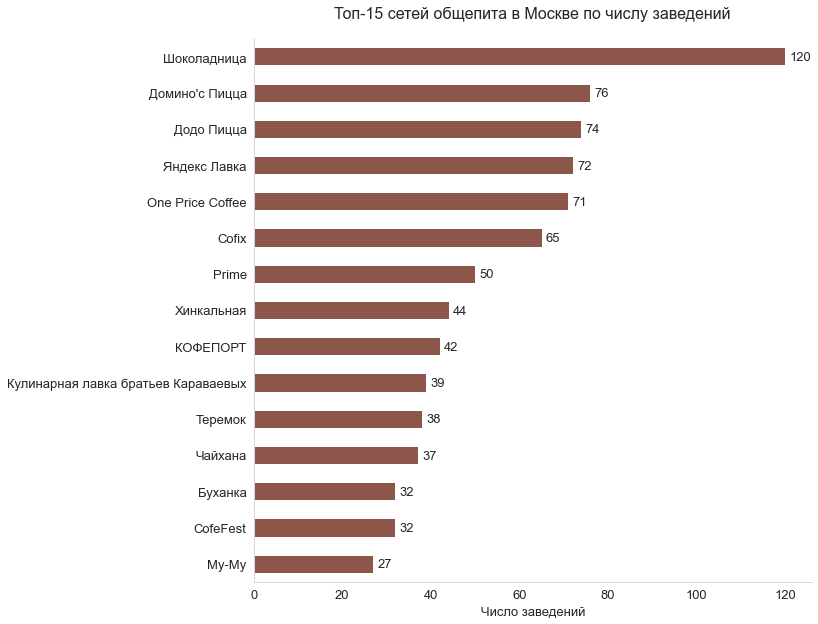

In [46]:
ax = pivot_chain_3.sort_values(by='count', ascending=True).plot(kind='barh', figsize=(10,10), grid=False, legend=False, color="#8c564b")
plt.title('Топ-15 сетей общепита в Москве по числу заведений', fontsize=16, pad=20)
plt.xticks(rotation=0, fontsize=13)
plt.xlabel('Число заведений', fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('', fontsize=13)
sns.despine()
for i, v in enumerate(pivot_chain_3['count'].sort_values(ascending=True)):
    ax.text(v+1, i-0.1, str(v), fontsize=13)
plt.savefig("top15_chains.jpg", format="jpg", bbox_inches='tight', dpi=200)    
plt.show()

**На первом месте - Шоколадница со 120 заведениями, на втором Домино'с Пицца - 76 пиццерий, на третьем Додо пицца - 72 пиццерии. Интересно, что несмотря на присутствие двух крупных пиццерий в топ-3 сетевых заведений, пиццерии как таковые, как мы выяснили в прошлом пункте, составляют лишь 10.3% от общего числа всех сетевых заведений.**

**Построим похожий график c указанием категорий заведений, которые входят в состав топ-15 сетей:** 

In [47]:
pivot_chain_4 = df.query('name in @pivot_chain_3.index').pivot_table(index='name', columns='category', values='address', aggfunc='count')
pivot_chain_4['sum'] = pivot_chain_4.sum(axis=1)
pivot_chain_4 = pivot_chain_4.sort_values(by='sum', ascending=False)
pivot_chain_4

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
name,,,,,,,,,
Шоколадница,NaN,NaN,NaN,1.0,119.0,NaN,NaN,NaN,120.0
Домино'с Пицца,NaN,NaN,NaN,NaN,NaN,76.0,NaN,NaN,76.0
Додо Пицца,NaN,NaN,NaN,NaN,NaN,74.0,NaN,NaN,74.0
Яндекс Лавка,NaN,NaN,NaN,NaN,NaN,NaN,72.0,NaN,72.0
One Price Coffee,NaN,NaN,NaN,NaN,71.0,NaN,NaN,NaN,71.0
Cofix,NaN,NaN,NaN,NaN,65.0,NaN,NaN,NaN,65.0
Prime,NaN,NaN,NaN,1.0,NaN,NaN,49.0,NaN,50.0
Хинкальная,3.0,NaN,6.0,19.0,NaN,NaN,15.0,1.0,44.0
КОФЕПОРТ,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,42.0


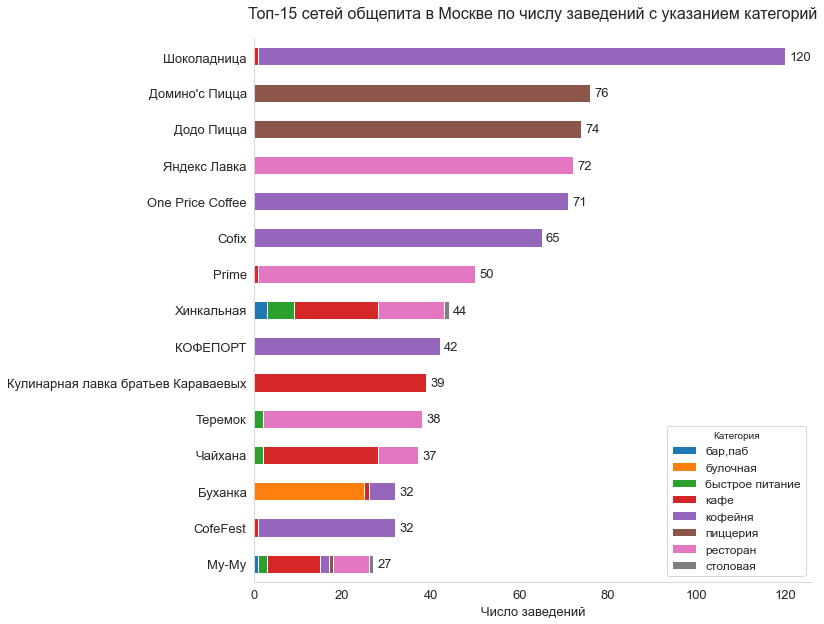

In [48]:
ax = pivot_chain_4.sort_values(by='sum', ascending=True).drop(columns='sum').plot(kind='barh', figsize=(10,10), grid=False, stacked=True, legend=True)
plt.title('Топ-15 сетей общепита в Москве по числу заведений c указанием категорий', fontsize=16, pad=20)
plt.xticks(rotation=0, fontsize=13)
plt.xlabel('Число заведений', fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('', fontsize=13)
sns.despine()
for i, v in enumerate(pivot_chain_3['count'].sort_values(ascending=True)):
    ax.text(v+1, i-0.1, str(v), fontsize=13)
plt.savefig("top15_chains.jpg", format="jpg", bbox_inches='tight', dpi=200)
plt.legend(title='Категория', fontsize='large')
plt.show()

**Построим такой же график с помощью plotly, чтобы можно было в интерактивном режиме посмотреть сколько заведений определенной категории входит в состав сети:**

In [49]:
pivot_chain_5 = df.query('name in @pivot_chain_3.index').groupby(['name','category']).agg({'name':'count'})
pivot_chain_5.columns=['count']
pivot_chain_5 = pivot_chain_5.reset_index()
pivot_chain_5

,name,category,count
0,CofeFest,кафе,1
1,CofeFest,кофейня,31
2,Cofix,кофейня,65
3,One Price Coffee,кофейня,71
4,Prime,кафе,1
5,Prime,ресторан,49
6,Буханка,булочная,25
7,Буханка,кафе,1
8,Буханка,кофейня,6
9,Додо Пицца,пиццерия,74


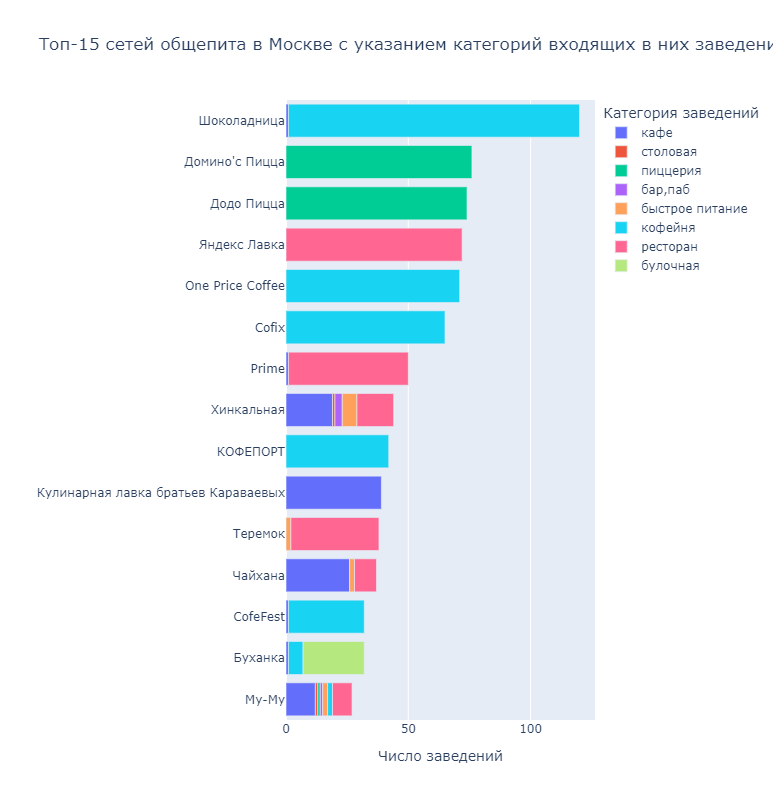

In [50]:
fig = px.bar(pivot_chain_5.sort_values(by='count', ascending=True).reset_index(), y='name', x='count', color='category', 
             orientation='h', title ='Топ-15 сетей общепита в Москве с указанием категорий входящих в них заведений', width=1000, height=800,
            category_orders={'name': pivot_chain_3.index[::1]})
fig.update_layout(xaxis_title = 'Число заведений',
                  yaxis_title = '',
                 legend = dict(title='Категория заведений'))
fig.show()

**В топ-3 сетей общепита: Шоколадница (120 заведений), Домино'с Пицца (76) и Додо Пицца (74). При этом они являются преимущественно монокатегорийными. Лишь у Шоколадницы из 120 заведений - 1 кафе, а все остальные - кофейни. Возможно, это просто ошибка записи в датасете. Также полностью или почти монокатегорийные сети из топ-15 - Яндекс Лавка (рестораны), One Price Coffee, Cofix, КОФЕПОРТ, CofeFest (кофейни), Кулинарная лавка братьев Караваевых (кафе), Prime (рестораны). Другие сети в той или иной степени поликатегорийны.**  

**В сетевом топе практически нет баров и столовых.**
**Судя по тому, какие сети мы видим среди самых популярных - очень важным фактором успеха является опция доставки еды. Кроме того, значительная часть топа - заведения, которые можно открыть, купив франшизу (Шоколадница, Домино'c Пицца, Додо Пицца, Яндекс Лавка, One Price Coffee, Cofix, КОФЕПОРТ, Кулинарная лавка братьев Караваевых...)**

### Какие административные районы Москвы присутствуют в датасете?

**Создадим сводную таблицу, в которой отразим число точек общепита в каждом из представленных районов города по типам заведения:**

In [51]:
district_pivot = df.pivot_table(index='district', values='name', columns='category', aggfunc='count')
district_pivot = district_pivot.sort_values(by='Восточный административный округ', ascending=False, axis=1)
district_pivot['sum'] = district_pivot.sum(axis=1)
district_pivot = district_pivot.sort_values(by='sum', ascending=False)
district_pivot = district_pivot.drop(columns='sum')
# уберем длинные названия районов, чтобы не загромождать оси будущего графика
district_pivot = district_pivot.rename(index={'Центральный административный округ':'ЦАО', 'Северный административный округ':'САО',
                                      'Южный административный округ':'ЮАО', 'Северо-Восточный административный округ':'СВАО',
                                      'Западный административный округ':'ЗАО', 'Восточный административный округ':'ВАО',
                                      'Юго-Восточный административный округ':'ЮВАО', 'Юго-Западный административный округ':'ЮЗАО',
                                      'Северо-Западный административный округ':'СЗАО'})
district_sum = district_pivot.sum(axis=1).reset_index()
district_sum.columns = ['district','num']
district_pivot
district_sum

,district,num
0,ЦАО,2242
1,САО,898
2,ЮАО,892
3,СВАО,891
4,ЗАО,851
5,ВАО,798
6,ЮВАО,714
7,ЮЗАО,709
8,СЗАО,409


**Построим график:**

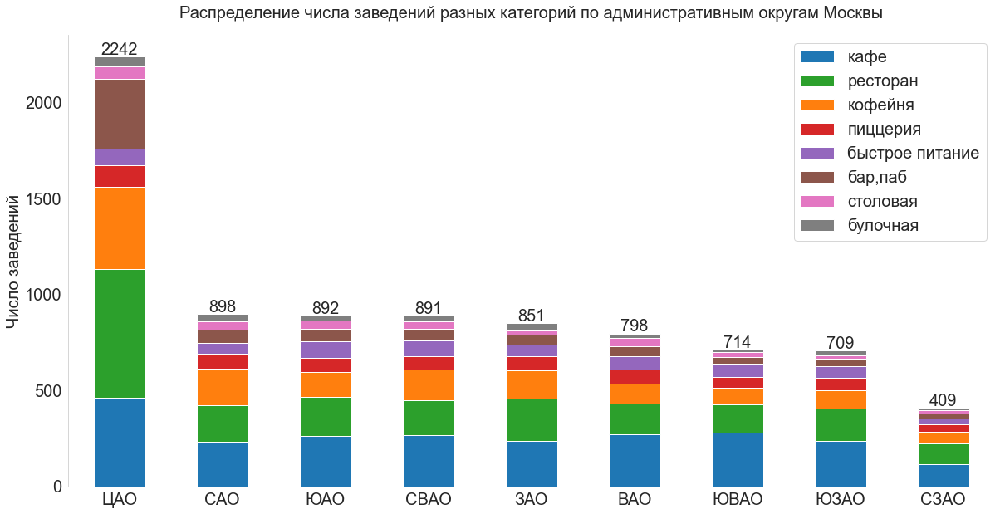

In [52]:
colors = ['#1f77b4', '#2ca02c', '#ff7f0e', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
ax = district_pivot.plot(kind='bar', figsize=(20,10), grid=False, color=colors, stacked=True)
plt.title('Распределение числа заведений разных категорий по административным округам Москвы', fontsize=20, pad=20)
plt.xticks(rotation=0, fontsize=20)
plt.xlabel('', fontsize=15)
plt.yticks(fontsize=20)
plt.ylabel('Число заведений', fontsize=20)
plt.legend(fontsize=20)
sns.despine()
for i, v in enumerate(district_sum['num']):
    ax.text(i, v + 10, str(v), ha='center',fontsize=20)
plt.savefig("districts.jpg", format="jpg", bbox_inches='tight', dpi=200) 
plt.show()

**Первое, что бросается в глаза - число заведений в Центральном административном округе (ЦАО) более чем в два раза превышает число заведений в любом другом округе. В ЦАО более двух тысяч точек общественного питания, тогда как в других районах оно не достигает и одной тысячи. Меньше всего общепита в Северо-Западном административном округе - около 400 точек**   

**Второе - во всех округах, кроме Центрального, тройка лидеров по типу заведений выглядит следующим образом: на первом по численности месте - кафе, на втором - рестораны, на третьем - кофейни. В Центральном округе тройка лидеров такая же, но ресторанов  больше чем кафе**

**Третье - в ЦАО очень большое количество баров и пабов (364), тогда как во всех других районах вместе взятых их 401:**  

In [53]:
district_pivot[['бар,паб']].sum()-district_pivot.loc['ЦАО',['бар,паб']]

category
бар,паб    401
dtype: int64

**Абсолютное количество заведений в районе нельзя считать достоверным показателем развития гастрономической инфраструктуры, т.к. площадь районов разная, и от нее зависит результирующая плотность заведений в конкретном районе.**

### Средние рейтинги заведений по типам (рестораны, кафе, кофейни и т.д.)

**Получим таблицу со средними и медианными рейтингами заведений по категориям:**

In [54]:
round(df.pivot_table(index='category', values='rating', aggfunc=['mean','median']), 2)

,mean,median
,rating,rating
category,,
"бар,паб",4.39,4.4
булочная,4.27,4.3
быстрое питание,4.05,4.2
кафе,4.12,4.2
кофейня,4.28,4.3
пиццерия,4.30,4.3
ресторан,4.29,4.3
столовая,4.21,4.3


**Построим боксплот без лимита по оси x, покажем на графике средние значения и стат. выбросы и оценим форму распределений рейтингов:**

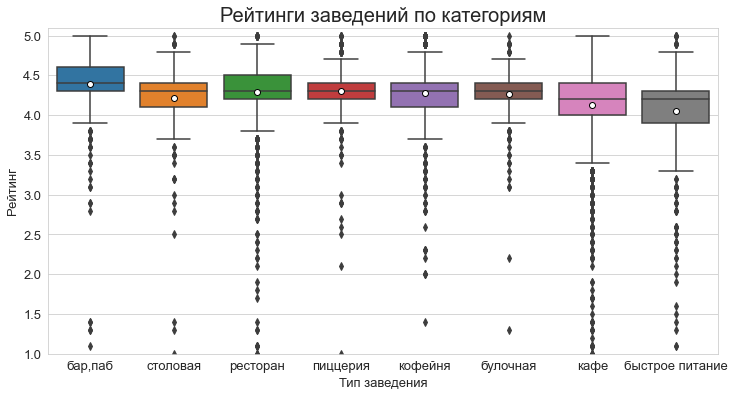

In [55]:
plt.figure(figsize=(12,6))
ranks = df.groupby('category')['rating'].median().fillna(0).sort_values()[::-1].index
sns.boxplot(y='rating', x='category', data=df, showmeans=True, order=ranks, 
           meanprops={'marker': 'o', 'markerfacecolor': 'w', 'markeredgecolor': 'k'})
plt.title('Рейтинги заведений по категориям', fontsize=20)
plt.xlabel('Тип заведения', fontsize=13)
plt.ylabel('Рейтинг', fontsize=13)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim(1,5.1)
plt.show()

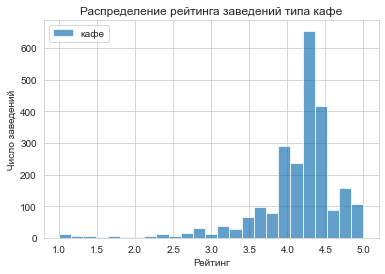

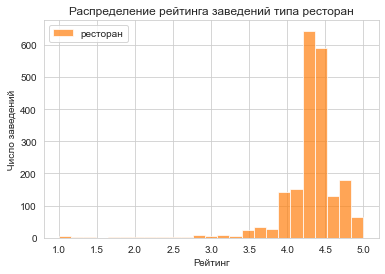

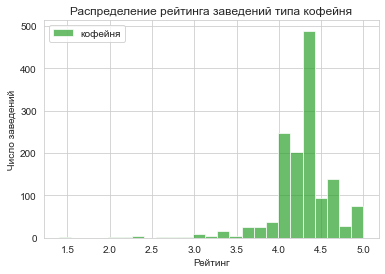

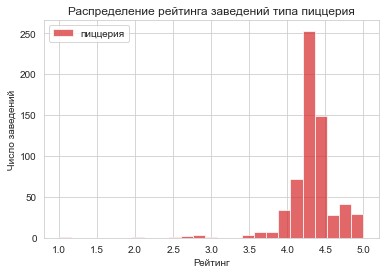

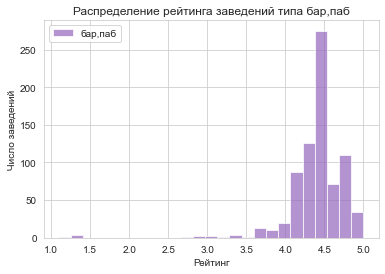

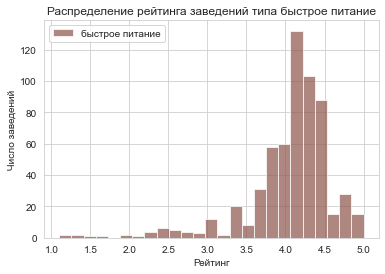

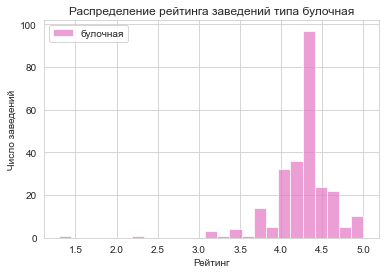

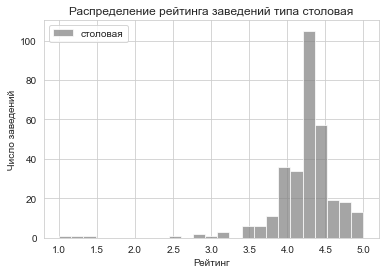

In [56]:
colors = sns.color_palette("tab10")
for i, category in enumerate(df['category'].unique()):
    color = colors[i]
    df.query('category == @category').plot(kind='hist', y='rating', bins=25, alpha=0.7, label=category, color=color)
    plt.title(f'Распределение рейтинга заведений типа {category}')
    plt.xlabel('Рейтинг')
    plt.ylabel('Число заведений')
    plt.show()

**Для всех типов заведений подавляющее большинство значений рейтинга находится между 3.5 и 5.0. Все распределения имеют "хвосты" растянутые влево. Это значит, что небольшая часть заведений имеет рейтинги ниже чем 3.5. Причем среди точек быстрого питания и кафе таких заведений больше, чем среди других категорий.**

**Уберем с боксплотов, построенных выше, выбросы, и сравним средние рейтинги:**

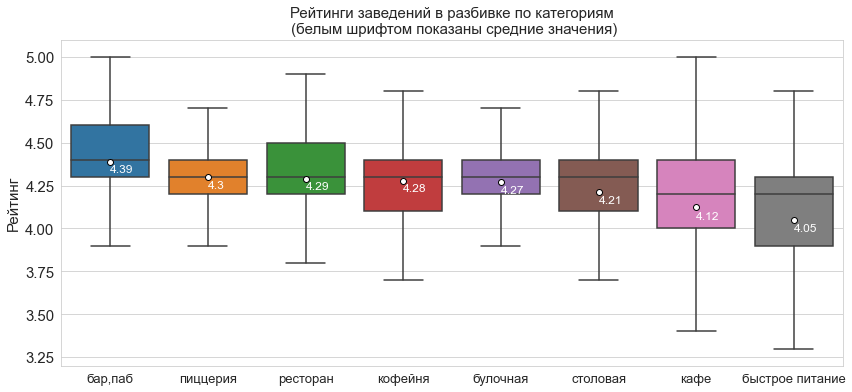

In [57]:
plt.figure(figsize=(14,6))
ranks = df.groupby('category')['rating'].mean().fillna(0).sort_values()[::-1].index
ax = sns.boxplot(y='rating', x='category', data=df.sort_values(by='category'), order=ranks, showmeans=True, showfliers=False, 
           meanprops={'marker': 'o', 'markerfacecolor': 'w', 'markeredgecolor': 'k'})
plt.ylim(3.2,5.1)
plt.title('Рейтинги заведений в разбивке по категориям\n (белым шрифтом показаны средние значения)', fontsize=15)
plt.xlabel('', fontsize=15)
plt.ylabel('Рейтинг', fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=15)

means = round(df.groupby(['category'])['rating'].mean().sort_values()[::-1],2)
vertical_offset = df['rating'].mean() * 0.015
for xtick in ax.get_xticks():
    ax.text(xtick,means[xtick]-vertical_offset,means[xtick], 
            horizontalalignment='left',size='large',color='w')
plt.show()

**Средние рейтинги находятся в пределах 4.05-4.39. При этом самое высокое среднее значение рейтинга у баров и пабов (4.39), а самые низкие - у заведений быстрого питания (4.05) и кафе (4.12). Для остальных категорий средние рейтинги лежат в пределах 4.2-4.3. Похоже, что у пабов самая благодарная публика, а может быть дело в том, что половина пабов находится в Центральном округе и волей-неволей приходится держать марку из-за высокой конкуренции. Низкие оценки точек быстрого питания - частая история, поскольку отношение к ним противоречивое, и всегда находятся желающие покритиковать фастфуд просто за то, что он им является.**

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [58]:
pivot_rating = df.pivot_table(index = 'district', values='rating', aggfunc='mean').reset_index().sort_values(by='rating', ascending=False)
pivot_rating

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240980
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


**Создадим карту с центром в центром Москвы:**

In [59]:
lat, lng = 55.751244, 37.618423
m = Map(location=[lat, lng], tiles='Cartodb Positron', zoom_start=10)

In [60]:
try:
    with open('admin_level_geomap.geojson', encoding='utf-8') as f:
        borders = json.load(f)
except:
    with urllib.request.urlopen("https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson") as f:
        borders = json.load(f)

**Добавим хороплет и значения среднего рейтинга на карту:**

In [61]:
Choropleth(geo_data = borders,
          data = pivot_rating,
          columns = ['district', 'rating'],
          key_on = 'feature.name',
          fill_color = 'Oranges',
          fill_opacity = 0.7,
          legend_name = 'Средний рейтинг заведений').add_to(m)
m

**Хороплет показывает, что лучше всего дела с рейтингом заведений обстоят в Центальном административном округе, также сравнительно высокие рейтинги имеют заведения Северо-Западного и Северного административных округов. Хуже всего с рейтингом у заведений Юго-Восточного административного округа.**

### Отображение заведений на карте при помощи кластеров

**Снова создадим чистую карту Москвы:**

In [62]:
lat, lng = 55.751244, 37.618423
m = Map(location=[lat, lng], tiles='Cartodb Positron', zoom_start=10)

**Создадим пустой кластер `cluster` и добавbм его на карту:**

In [63]:
cluster = MarkerCluster().add_to(m)

**Напишем функцию, которая будет построчно извлекать из датафрейма `df` информацию о широте и долготе, а также о названии и рейтинге заведения, создавать маркер с соответствующими параметрами и добавлять его в кластер `cluster`:**

In [64]:
def fill_cluster(row):
    Marker([row['lat'], row['lng']], popup = f'{row["name"]}, рейтинг: {row["rating"]}').add_to(cluster)

**Добавляем маркеры в кластер и отображаем карту:**

In [65]:
df.apply(fill_cluster, axis=1)
m

**Хороплет отлично демонстрирует высокую концентрацию заведений в центре, на севере и юго-западе.** 

### Топ-15 улиц по количеству заведений

**Создадим сводную таблицу с названиями улиц и числом заведений:**

In [66]:
top_streets = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by='name', ascending=False)[:15]
top_streets.columns = ['count']
top_streets

,count
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


**По числу заведений общепита лидирует проспект Мира (184 точки), на втором месте - Профсоюзная улица (122), на третьем - проспект Вернадского (108). Замыкает топ-15 Пятницкая улица (48 заведений).**

**Теперь посмотрим, как распределены заведения по категориям на этих улицах:**

In [67]:
top_15_streets = df.query('street in @top_streets.index').groupby(['street', 'category']).agg({'name':'count'})
top_15_streets = top_15_streets.reset_index().sort_values(by=['street', 'category'], ascending=True).sort_values(by='name', ascending = False)
top_15_streets.columns = ['street', 'category', 'count']
top_15_streets

,street,category,count
93,проспект Мира,кафе,53
63,МКАД,кафе,45
96,проспект Мира,ресторан,45
94,проспект Мира,кофейня,36
70,Профсоюзная улица,кафе,35
...,...,...,...
58,Люблинская улица,пиццерия,1
83,проспект Вернадского,булочная,1
23,Кутузовский проспект,булочная,1
66,МКАД,столовая,1


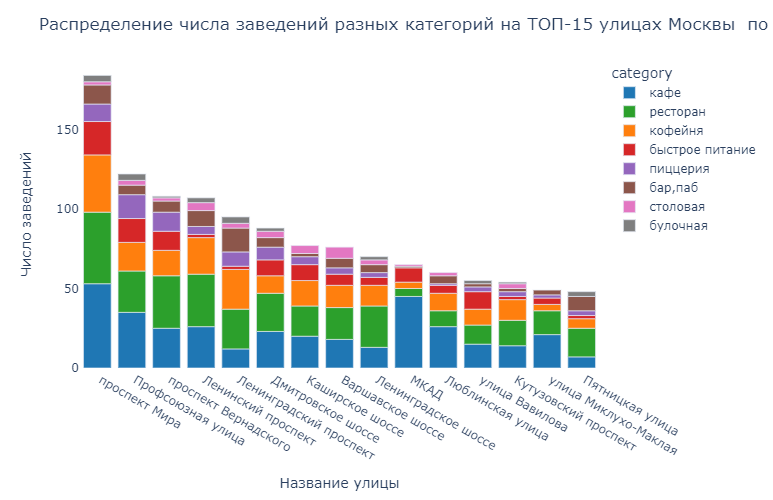

In [68]:
fig = px.bar(top_15_streets, x='street', y='count', color='category',
            color_discrete_map={
        'кафе': '#1f77b4',
        'ресторан': '#2ca02c',
        'кофейня':'#ff7f0e',
        'быстрое питание':'#d62728',
        'пиццерия':'#9467bd',
        'бар,паб':'#8c564b',
        'столовая':'#e377c2',
        'булочная':'#7f7f7f'})
fig.update_layout(title='Распределение числа заведений разных категорий на ТОП-15 улицах Москвы\n по количеству общепита',
                 width=1000, height=500, xaxis_title="Название улицы", yaxis_title="Число заведений",
                 xaxis={'categoryorder':'total descending'}                 )
fig.update_layout(
    {
        "paper_bgcolor": "rgba(0, 0, 0, 0)",
        "plot_bgcolor": "rgba(0, 0, 0, 0)",
    }
)

**На большинстве улиц из топ-15 преобладают кафе и рестораны с примерно равномерным распределением между этими двумя категориями. Исключение составляет МКАД, на котором 45 кафе и лишь пять ресторанов, что вполне объяснимо: кафе, вероятнее всего располагаются на заправочных станциях, а сидеть в ресторане на МКАДе - затея так себе. На Пятницкой улице, Ленинградском проспекте и Ленинградском шоссе, наоборот, много ресторанов и мало кафе. Вероятно, расположение этих улиц больше располагает к более серьезному гастрономическому подходу.**

### Улицы, на которых только один объект общепита

In [69]:
one_place_streets = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count').query('name == 1')
one_place_streets.columns=['count']
one_place_streets.info()

<class 'pandas.core.frame.DataFrame'>
Index: 459 entries,  1-й Автозаводский проезд to  № 7
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   count   459 non-null    int64
dtypes: int64(1)
memory usage: 7.2+ KB


**Итак, в Москве 458 улиц, на которых только по одному объекту общепита. Чисто теоретически можно предположить, что это либо очень короткие улицы, либо улицы в спальных районах или промзонах. Чтобы проверить эти предположения, нанесем маркеры с местоположением этих заведений а карту. Создадим карту и кластер:**

In [70]:
lat, lng = 55.751244, 37.618423
m = Map(location=[lat, lng], tiles='Cartodb Positron', zoom_start=10)
cluster2 = MarkerCluster().add_to(m)

**Cоздадим датафрейм `df_one_place`, в который войдут только о тех заведениях, которые являются единственными на своей улице:**

In [71]:
df_one_place = df.query('street in @one_place_streets.index')
df_one_place.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 459 entries, 15 to 8398
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               459 non-null    object 
 1   category           459 non-null    object 
 2   address            459 non-null    object 
 3   district           459 non-null    object 
 4   hours              432 non-null    object 
 5   lat                459 non-null    float64
 6   lng                459 non-null    float64
 7   rating             459 non-null    float64
 8   price              182 non-null    object 
 9   avg_bill           194 non-null    object 
 10  middle_avg_bill    165 non-null    float64
 11  middle_coffee_cup  24 non-null     float64
 12  chain              459 non-null    int64  
 13  seats              156 non-null    float64
 14  is_duplicated      459 non-null    bool   
 15  street             459 non-null    object 
 16  is_24/7            459 n

**Добавим маркеры этих заведений на карту:**

In [72]:
def fill_cluster2(row):
    Marker([row['lat'], row['lng']], popup = f'{row["name"]}, рейтинг: {row["rating"]}').add_to(cluster2)

In [73]:
df_one_place.apply(fill_cluster2, axis=1)
m

**По карте видно, что как в центре города так и на окраинах есть заведения, которые являются единственными на своей улице. Более детальное рассмотрение карты показывает, что в действительности многие из таких завдений располагаются на коротких улицах или в переулках. На окраинах они есть в парках, промзонах и спальных районах.**

**Посмотрим, к каким категориям общепита относятся такие заведения:**

In [74]:
one_place_pivot = df_one_place.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False)
one_place_pivot.columns=['count_one_place']
one_place_pivot

,count_one_place
category,
кафе,160
ресторан,94
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


**Присутствуют заведения всех категорий. Посмотрим, какой процент от общего числа заведений по категориям в Москве являются единственными на своей улице. Для этого сначала посчитаем все заведения Москвы по категориям:**

In [75]:
all_places_pivot = df.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False)
all_places_pivot.columns=['count_all_places']
all_places_pivot

,count_all_places
category,
кафе,2377
ресторан,2042
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


**Объединим таблицы:**

In [76]:
places_pivot = one_place_pivot.join(all_places_pivot)
places_pivot

,count_one_place,count_all_places
category,,
кафе,160,2377
ресторан,94,2042
кофейня,84,1413
"бар,паб",39,765
столовая,36,315
быстрое питание,23,603
пиццерия,15,633
булочная,8,256


**Рассчитаем процент:**

In [77]:
places_pivot['percent'] = round(places_pivot['count_one_place']/places_pivot['count_all_places']*100,1)
places_pivot

,count_one_place,count_all_places,percent
category,,,
кафе,160,2377,6.7
ресторан,94,2042,4.6
кофейня,84,1413,5.9
"бар,паб",39,765,5.1
столовая,36,315,11.4
быстрое питание,23,603,3.8
пиццерия,15,633,2.4
булочная,8,256,3.1


**А вот и интересная находка - самый большой процент заведений, которые являются единственными на своей улице, среди столовых - 11.4 %**

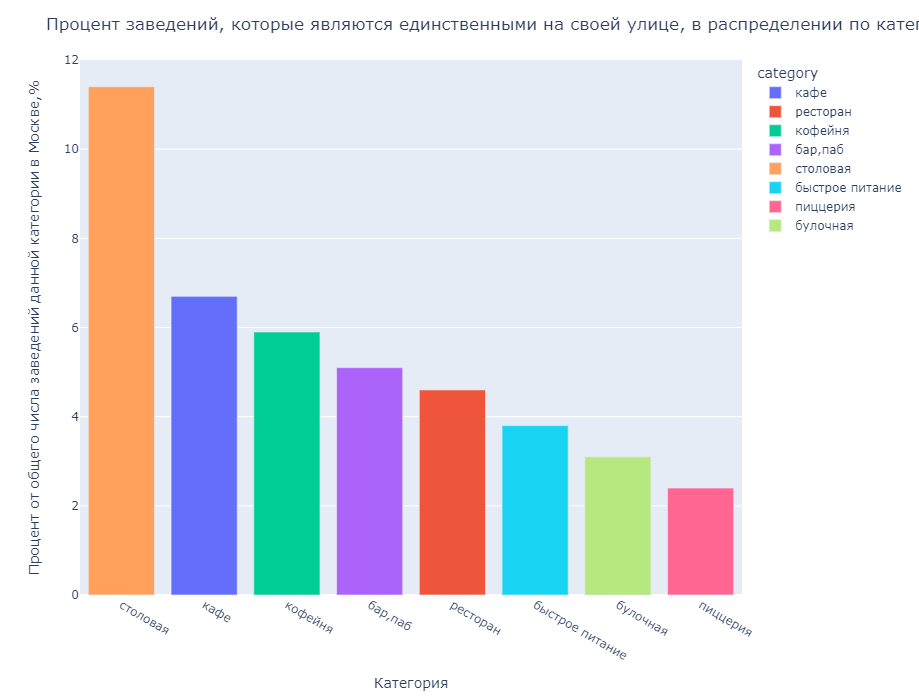

In [78]:
fig = px.bar(places_pivot.reset_index(), x='category', y='percent', color='category')
fig.update_layout(title='Процент заведений, которые являются единственными на своей улице, в распределении по категориям',
                 width=1000, height=700, xaxis_title="Категория", yaxis_title="Процент от общего числа заведений данной категории в Москве,%",
                 xaxis={'categoryorder':'total descending'})

**Посмотрим, где они расположены:**

In [79]:
lat, lng = 55.751244, 37.618423
m = Map(location=[lat, lng], tiles='Cartodb Positron', zoom_start=10)
cluster3 = MarkerCluster().add_to(m)

In [80]:
def fill_cluster3(row):
    Marker([row['lat'], row['lng']], popup = f'{row["name"]}, рейтинг: {row["rating"]}').add_to(cluster3)

In [81]:
df_one_place.query('category == "столовая"').apply(fill_cluster3, axis=1)
m

**В пределах Садового кольца таких столовых только две. Я не очень хорошо знаю Москву, но рискну предположить, что многие из них - столовые, расположенные рядом с крупными производственными предприятиями.**

**Посмотрим, отличается ли средний рейтинг столовых, которые являются единственными заведениями общепита на своей улице, от среднего рейтинга всех столовых по Москве. Возможно, отсутствие конкуренции приводит к снижению качества обслуживания?**

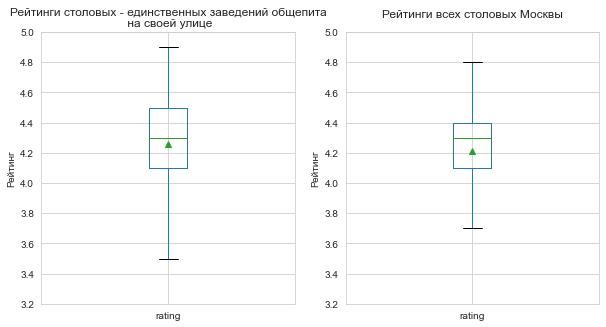

In [82]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,5))
df_one_place.query('category == "столовая"')['rating'].plot(kind='box', showmeans=True, showfliers=False, ax=ax1)
ax1.set_title('Рейтинги столовых - единственных заведений общепита\n на своей улице', fontsize=12)
ax1.set_ylim(3.2, 5)
ax1.set_ylabel('Рейтинг')
df.query('category == "столовая"')['rating'].plot(kind='box', showmeans=True, showfliers=False, ax=ax2)
ax2.set_title('Рейтинги всех столовых Москвы', fontsize=12, pad=15)
ax2.set_ylim(3.2, 5)
ax2.set_ylabel('Рейтинг')
plt.show()

In [83]:
print("Данные о рейтингах столовых, которые являются единственными заведениями общепита на своей улице")
df_one_place.query('category == "столовая"')['rating'].describe()

Данные о рейтингах столовых, которые являются единственными заведениями общепита на своей улице


count    36.000000
mean      4.261111
std       0.351550
min       3.000000
25%       4.100000
50%       4.300000
75%       4.500000
max       4.900000
Name: rating, dtype: float64

In [84]:
print("Данные о рейтингах всех столовых Москвы")
df.query('category == "столовая"')['rating'].describe()

Данные о рейтингах всех столовых Москвы


count    315.000000
mean       4.211429
std        0.454205
min        1.000000
25%        4.100000
50%        4.300000
75%        4.400000
max        5.000000
Name: rating, dtype: float64

**Медианные рейтинги вообще не различаются (4.3), а средний даже несколько ниже в общем по Москве. Предположение о снижении качества обслуживания в столовых, являющихся единственным общепитом на своей улице, не подтверждается.** 

### Как медианный чек заведений меняется от округа к округу?

**Проанализируем цены на общепит в каждом районе. Для этого используем показатель среднего чека заведений. Создадим сводную таблицу с названием округов и медианным средним чеком:**

In [85]:
median_avg_bill = df.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc='median').reset_index().sort_values(by='middle_avg_bill', ascending = False)
median_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


**Самый большой средний чек в заведения общепита, расположенных на территории Центрального и Западного административных округов (1000 рублей). На третьем месте - Северо-Западный административный округ (700 рублей). Самый низкий средний чек в Юго-Восточном округе.** 

**Визуализируем полученные данные на фоновой картограмме:**

In [86]:
lat, lng = 55.751244, 37.618423
m = Map(location=[lat, lng], tiles='Cartodb Positron', zoom_start=10)
Choropleth(geo_data = borders,
          data = median_avg_bill,
          columns = ['district', 'middle_avg_bill'],
          key_on = 'feature.name',
          fill_color = 'Oranges',
          fill_opacity = 0.7,
          legend_name = 'Медианный средний счет').add_to(m)
m

### Как расстояние от центра города влияет на средний чек в заведениях общественного питания Москвы? (доп. задание)

**Попробуем более подробно изучить зависимость среднего чека в заведениях от расстояния до центра города: для этого создадим функцию `get_distance`, которая будет по координатам центра города и координатам заведения определять расстояние между ними по прямой в километрах:**

In [87]:
def get_distance(row):
    loc1=(55.751244, 37.618423) # координаты центра Москвы
    loc2=(row['lat'], row['lng']) #
    distance = hs.haversine(loc1,loc2)
    return distance

**Создадим в датафрейме новый столбец `distance` и запишем туда расстояние от центра города до заведения, округленное до километра:**

In [88]:
df['distance'] = round(df.apply(get_distance, axis=1))

**Создадим сводную таблицу, в которую запишем медианны значения среднего чека в зависимости от расстояния и типа заведения:**

In [89]:
pivot_prices = df.pivot_table(index='distance', columns='category', values='middle_avg_bill', aggfunc='median')
pivot_prices

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
distance,,,,,,,,
0.0,1100.0,NaN,NaN,NaN,NaN,1250.0,NaN,NaN
1.0,1250.0,2250.0,575.0,800.0,875.0,1250.0,1250.0,400.0
2.0,1250.0,1500.0,525.0,800.0,475.0,1500.0,1500.0,275.0
3.0,1250.0,575.0,420.0,500.0,420.0,1050.0,1250.0,312.5
4.0,1425.0,450.0,387.5,675.0,600.0,775.0,1250.0,282.5
5.0,1250.0,600.0,400.0,512.5,375.0,587.5,1075.0,300.0
6.0,1200.0,950.0,450.0,500.0,350.0,500.0,925.0,280.0
7.0,900.0,360.0,487.5,400.0,400.0,500.0,1250.0,280.0
8.0,1125.0,400.0,325.0,600.0,600.0,750.0,1025.0,315.0


**Выполним бегущее усреднение, чтобы сгладить всплески медианного чека на отдельных расстояниях:**

In [90]:
pivot_prices = pivot_prices.rolling(2).mean()
pivot_prices

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
distance,,,,,,,,
0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1.0,1175.0,NaN,NaN,NaN,NaN,1250.00,NaN,NaN
2.0,1250.0,1875.00,550.00,800.00,675.00,1375.00,1375.0,337.50
3.0,1250.0,1037.50,472.50,650.00,447.50,1275.00,1375.0,293.75
4.0,1337.5,512.50,403.75,587.50,510.00,912.50,1250.0,297.50
5.0,1337.5,525.00,393.75,593.75,487.50,681.25,1162.5,291.25
6.0,1225.0,775.00,425.00,506.25,362.50,543.75,1000.0,290.00
7.0,1050.0,655.00,468.75,450.00,375.00,500.00,1087.5,280.00
8.0,1012.5,380.00,406.25,500.00,500.00,625.00,1137.5,297.50


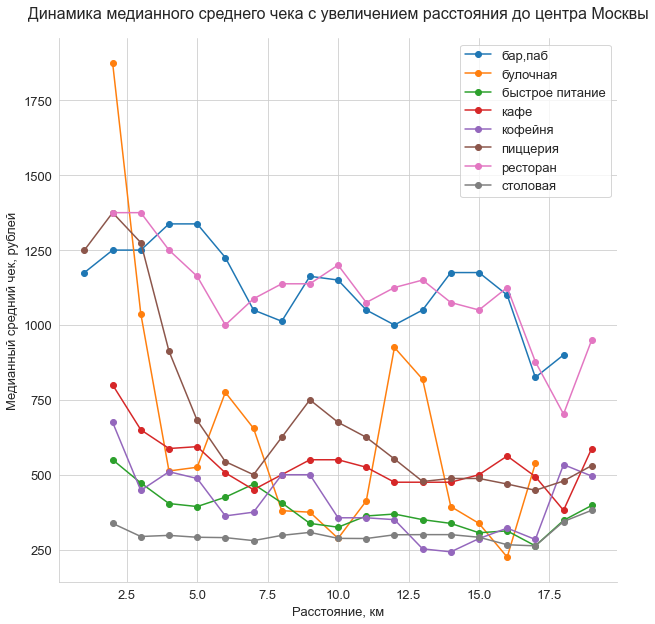

In [91]:
fig, ax = plt.subplots(figsize=(10,10))
pivot_prices.plot(kind='line', ax=ax, marker='o')
plt.title('Динамика медианного среднего чека с увеличением расстояния до центра Москвы', fontsize=16, pad=20)
plt.xticks(rotation=0, fontsize=13)
plt.xlabel('Расстояние, км', fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('Медианный средний чек, рублей', fontsize=13)
plt.legend(fontsize=13)
sns.despine()
plt.savefig("distance_prices.jpg", format="jpg", dpi=200)
plt.show()

**График демонстрирует, что медианный средний чек снижается с увеличением расстояния от центра города для большинства категорий заведений. Самую сильную зависимость от расстояния демонстриует мединанный средний чек для булочных и пиццерий (так, например, в центре города средний чек в пиццерии составляет 1250 рублей, а в 19 км от центра - 530 рублей). Средние чеки в барах и ресторанах в центре около 1250 рублей а на окраине - меньше 1000 рублей. Средний чек в кафе в центре города - 800 рублей, на окраине - 587. Практически не подвержены изменениям в зависимости от расстояния до центра только средние чеки в столовых (300-400 рублей).** 

### Общие выводы из исследовательского анализа рынка заведений общественного питания Москвы

1. В Москве представлены восемь категорий заведений общественного питания: кафе, рестораны, кофейни, бары и пабы, пиццерии, точки быстрого питания, столовые и булочные. Самые многочисленные из них - кафе (2378), рестораны (2043) и кофейни (1413) составляют около 2/3 всех заведений московского общепита. 
2. Количество поcадочных мест в заведениях значительно варьирует, однако медианные значения числа посадочных мест в заведениях разных категорий различаются не слишком сильно: наиболее вместительными можно считать рестораны, кофейни, пабы/бары и столовые  с медианным числом посадочных мест 86, 80, 82 и 76, соответственно. Несколько меньшую вместимость по медианным значениям числа посадочных мест имеют булочные, точки быстрого питания, кафе и пиццерии (50, 65, 60 и 55 посадочных мест, соответственно).
3. Почти 62% заведений, представленных в датасете несетевые, 38% - сетевые. При этом в абсолютном числовом выражении кафе, рестораны и кофейни составляют почти 2/3 всех сетевых заведений. Так происходит потому, что именно эти категории самые многочисленные.
4. Доля сетевых заведений выше всего среди булочных (61.3%) и пиццерий (52.1%). На третьем месте по доле сетевых заведений кофейни (51%). Реже всего сетевыми бывают бары/пабы (22.1%).
5. Три самых популярных сети общественного питания в Москве (если судить по числу заведений) это Шоколадница (120 точек), и пиццерии Домино'с Пицца (76 точек) и Додо Пицца (74 точки).
6. Анализ распределения заведений общепита по округам Москвы показывает, что больше всего точек общественного питания в Центральном округе (более 2000), при этом в остальных округах это число не превышает 1000.
7. В Центральном округе больше ресторанов чем кафе, тогда как в остальных округах число кафе больше чем ресторанов. Также в Центральном округе сконцентрировано около половины всех московских баров и пабов.
8. Самый высокий средний рейтинг у баров и пабов (4.39), а самый низкий - у точек быстрого питания (4.05). Похоже, что у баров и пабов самая благодарная публика, а может быть дело в том, что половина этих заведений находится в Центральном округе и волей-неволей приходится держать марку из-за высокой конкуренции. Низкие оценки точек быстрого питания - частая история, поскольку отношение к ним противоречивое, и всегда находятся желающие покритиковать фастфуд просто за то, что он им является.
9. Среди округов Москвы лидером по среднему рейтингу заведений является Центральный округ (4.37), второе и третье место занимают Северный и Северо-Западный административные округа (4.24 и 4.21). Самый низкий средний рейтинг у заведений Юго-Восточного административного округа (4.10).
10. Лидерами по числу заведений общепита среди улиц являются пр.Мира (184 точки), ул.Профсоюзная (122) и пр.Вернадского (108).
11. В Москве есть улицы, на которых расположено только одно заведение общепита. Чаще всего такими заведениями являются столовые: 11.4% всех столовых - единственные точки общепита на своей улице.
12. Самый высокий медианный средний чек в заведениях Центрального и Западного административных округов (1000 рублей). Самый низкий - в Юго-Восточном административном округе (450 рублей).
13. Для большинства категорий заведений общепита медианный средний чек снижается с увеличением расстояния от центра города. Наиболее выраженное снижение наблюдается для булочных и пиццерий, несколько меньшее - для баров и пабов, кофеен, кафе и ресторанов. Для столовых зависимость медианного среднего чека от расстояния до центра города не выявляется.

## Детализация исследования под открытие кофейни
**В этом разделе дадим ответы на некоторые вопросы, которые помогут понять особенности московских кофеен и позволят инвесторам принять правильные решения.**

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

**Посчитаем все кофейни в датасете:**

In [92]:
print("Всего кофеен: ", len(df.query('category == "кофейня"')))

Всего кофеен:  1413


**Посмотрим, как кофейни распределены по административным округам:**

In [93]:
coffee = df.query('category == "кофейня"').pivot_table(index='district', values='name', aggfunc='count').sort_values(by='name', ascending = False).reset_index()
coffee.columns=['district','count']
coffee

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


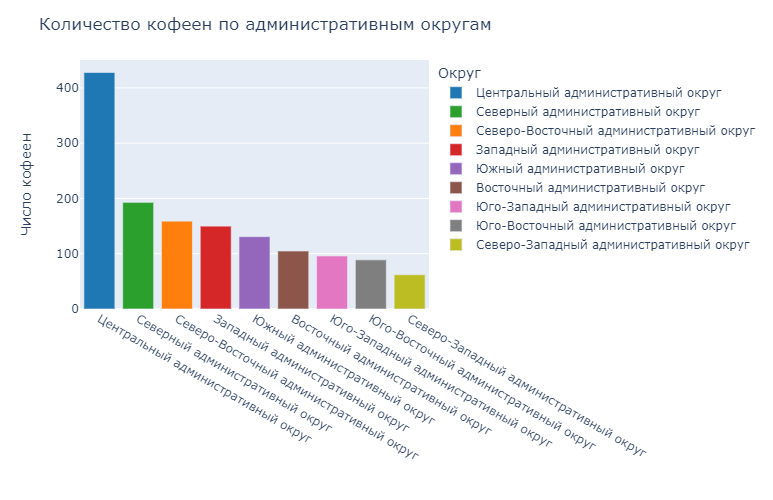

In [94]:
fig = px.bar(coffee, y='count', x='district', color='district',
            color_discrete_map={
        'Центральный административный округ': '#1f77b4',
        'Северный административный округ': '#2ca02c',
        'Северо-Восточный административный округ':'#ff7f0e',
        'Западный административный округ':'#d62728',
        'Южный административный округ':'#9467bd',
        'Восточный административный округ':'#8c564b',
        'Юго-Западный административный округ':'#e377c2',
        'Юго-Восточный административный округ':'#7f7f7f',
        'Северо-Западный административный округ':'#bcbd22'})
fig.update_layout(title='Количество кофеен по административным округам',
                  xaxis_title="", yaxis_title="Число кофеен",
                  width=1000, height=500,
                  legend = dict(title='Округ'))
fig.show()

**Всего в датасете 1413 кофеен. 30.3% из них сконцентрированы в Центральном округе, на втором месте - Северный округ (13.7%), на третьем - Северо-Восточный (11.3%). Меньше всего кофеен приходится на долю Северо-Западного административного округа - лишь 4.39%**

### Есть ли круглосуточные кофейни?

**Наверняка такие существуют. Проверим. Создаем таблицу, в которую поместим число кофеен, работающих 24/7, по районам:**

In [95]:
df = df.rename(columns={'is_24/7':'is_24'})
coffee_24 = df.query('category == "кофейня" and is_24').pivot_table(index='district', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
coffee_24.columns = ['district', 'count']
coffee_24

,district,count
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


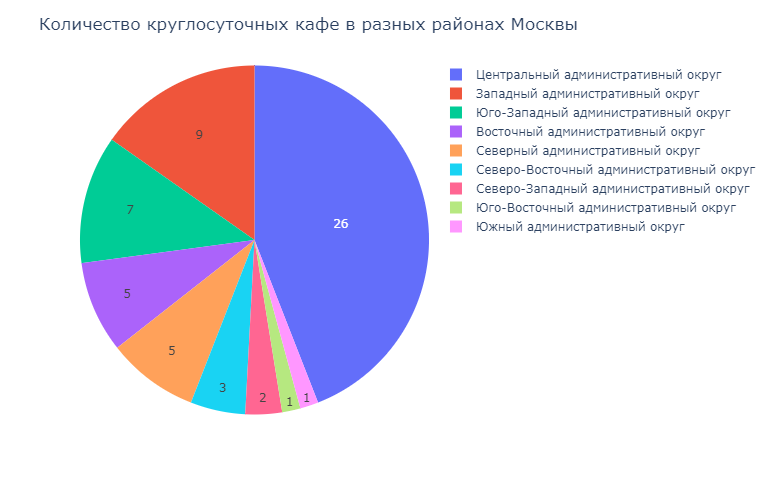

In [96]:
fig = px.pie(values=coffee_24['count'], names=coffee_24['district'])
fig.update_layout(title='Количество круглосуточных кафе в разных районах Москвы',
                 width=1000, height=500)
fig.update_traces(textinfo='value')
fig.show()

**Ожидаемо, по абсолютному числу круглосуточных кофеен лидирует Центральный округ. Но это потому что в нем в принципе много кофеен.**

**Теперь посчитаем, какой процент кофеен в каждом районе работает круглосуточно:**

In [97]:
coffee_24_percent = round(df.query('category == "кофейня"').pivot_table(index='district', values='is_24', aggfunc='mean').sort_values(by='is_24', ascending=False)*100,1)
coffee_24_percent = coffee_24_percent.reset_index()
coffee_24_percent

,district,is_24
0,Юго-Западный административный округ,7.3
1,Центральный административный округ,6.1
2,Западный административный округ,6.0
3,Восточный административный округ,4.8
4,Северо-Западный административный округ,3.2
5,Северный административный округ,2.6
6,Северо-Восточный административный округ,1.9
7,Юго-Восточный административный округ,1.1
8,Южный административный округ,0.8


**Проиллюстрируем на фоновой картограмме:**

In [98]:
lat, lng = 55.751244, 37.618423
m = Map(location=[lat, lng], tiles='Cartodb Positron', zoom_start=10)
Choropleth(geo_data = borders,
          data = coffee_24_percent,
          columns = ['district', 'is_24'],
          key_on = 'feature.name',
          fill_color = 'Oranges',
          fill_opacity = 0.7,
          legend_name = 'Процент круглосуточных кофеен в округах Москвы').add_to(m)
m

**Самый высокий процент круглосуточных кофеен в Юго-Западном, Центральном и Западном округах (7.3, 6.1 и 6.0 %). Хуже всего дела с круглосуточными кофейнями обстоят в Южном и Юго-Восточном округах (их около 1%). Возможно, открытие круглосуточного заведения в одном из этих районов - неплохая идея. Конкуренция будет невысока.** 

### Какие у кофеен рейтинги? Как они распределяются по районам?

**Для начала посмотрим на распределение рейтингов всех кофеен Москвы:**

In [99]:
df.query('category == "кофейня"')['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

**Медианный рейтинг кофеен 4.3, 50% кофеен имеют рейтинг в диапазоне от 4.1 до 4.4, минимальный рейтинг 1.4, масимальный - 5.0. Визуализируем распределение при помощи гистограммы:**

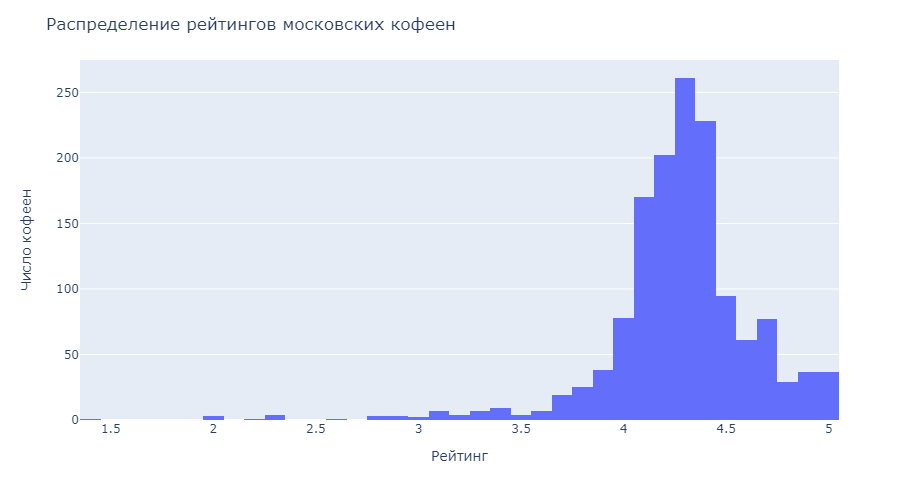

In [100]:
fig = px.histogram(df.query('category == "кофейня"')['rating'], x='rating', nbins=50)
fig.update_layout(title='Распределение рейтингов московских кофеен',
                  xaxis_title="Рейтинг", yaxis_title="Число кофеен",
                 width=800, height=500)
fig.show()

**Теперь посмотрим как рейтинги кофеен распределены по районам Москвы:**

In [101]:
df.query('category == "кофейня"').pivot_table(index='district', values='rating', aggfunc=['mean','median'])

,mean,median
,rating,rating
district,,
Восточный административный округ,4.282857,4.3
Западный административный округ,4.195333,4.2
Северный административный округ,4.291710,4.3
Северо-Восточный административный округ,4.216981,4.3
Северо-Западный административный округ,4.325806,4.3
Центральный административный округ,4.336449,4.3
Юго-Восточный административный округ,4.225843,4.3
Юго-Западный административный округ,4.283333,4.3


**В целом можно сказать, что рейтинги кофеен от округа к округу не отличаются друг от друга - медианный рейтинг во всех округах, за исключением Западного, равен 4.3. Есть округа, в которых средний рейтинг чуть ниже, чем в остальных, но это, по-видимому, связано с наличием отдельных завдений с низким рейтингом, которые смещают среднее.**

### На какую стоимость чашки капучино стоит ориентироваться при открытии кофейни?

**Для начала посмотрим, какой информацией мы располагаем относительно средней стоимости чашки капучино:**

In [102]:
df.query('~middle_coffee_cup.isna()')['middle_coffee_cup'].count()

535

**Всего у 535 заведений эта метрика указана. Выясним, что это за заведения:**

In [103]:
df.query('~middle_coffee_cup.isna()').pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False)

,name
category,
кофейня,521
"бар,паб",6
кафе,4
пиццерия,3
быстрое питание,1


**В подавляющем большинстве случаев это кофейни (521 запись). Помня о том, что у нас в датасете есть записи о 1413 кофейнях, можем заключить, что мы располагаем данными о средней стоимости чашки капучино примерно для 37% кофеен. Это хорошая выборка, однако может случиться так, что средняя стоимость чашки капучино будет указана в основном для высокорейтинговых заведений. Посмотрим, отличается ли распределение рейтингов заведений с указанной средней стоимостью чашки капучино от распределения рейтингов кофеен без указания этой стоимости. Для этого создадим в `df` новый столбец `coffee_price_indicated`, в который запишем `True` если цена указана и `False` если не указана:**

In [104]:
df['coffee_price_indicated'] = ~df['middle_coffee_cup'].isna()

**Построим гистограммы:**

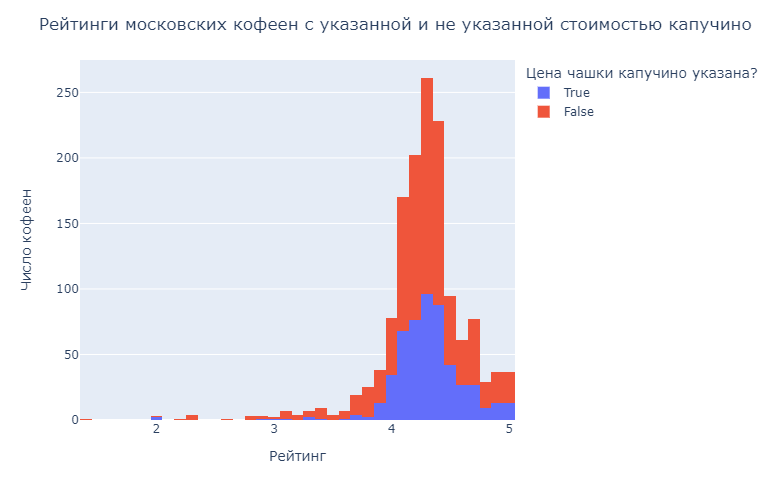

In [105]:
fig = px.histogram(df.query('category == "кофейня"'), x='rating', color='coffee_price_indicated', nbins=50)
fig.update_layout(title='Рейтинги московских кофеен с указанной и не указанной стоимостью капучино',
                  xaxis_title="Рейтинг", yaxis_title="Число кофеен",
                 width=800, height=500,
                 legend = dict(title='Цена чашки капучино указана?'))
fig.show()

**В целом, распределения похожи по форме, и, скорее всего, наша выборка репрезентативна. Теперь посмотрим, достаточно ли данных по районам города, вычислив процент кофеен с указанной средней стоимостью чашки капучино:**

In [106]:
round(df.query('category == "кофейня"').pivot_table(index='district', values='coffee_price_indicated', aggfunc='mean')*100,1)

,coffee_price_indicated
district,
Восточный административный округ,40.0
Западный административный округ,32.7
Северный административный округ,39.4
Северо-Восточный административный округ,37.7
Северо-Западный административный округ,33.9
Центральный административный округ,37.9
Юго-Восточный административный округ,38.2
Юго-Западный административный округ,35.4
Южный административный округ,32.8


**Выраженных "провалов" по районам не заметно. Можем оценивать стоимость чашки по всему городу и отдельно по районам:**

In [107]:
df.query('category == "кофейня"')['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

**Медианная стоимость чашечки капучино в Москве - 170 рублей, половина кофеен предлагает капучино в ценовом диапазоне 124-225 рублей. Минимальная сумма, которую придется отдать в Москве за чашку капучино - 60 рублей, максимальная - 1568 рублей. Дороговато для чашки капучино, посмотрим, где такие цены:** 

In [108]:
df[df['middle_coffee_cup'] == 1568]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated,street,is_24,distance,coffee_price_indicated
2857,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,False,Большая Семёновская улица,False,7.0,True


**Похоже, ошибка записи. Удалим эту строку:**

In [109]:
df = df.drop(index=2857)

In [110]:
df[df['middle_coffee_cup'] == 1568]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated,street,is_24,distance,coffee_price_indicated


**Теперь посмотрим как обстоят дела с ценой на капучино в разных районах города:**

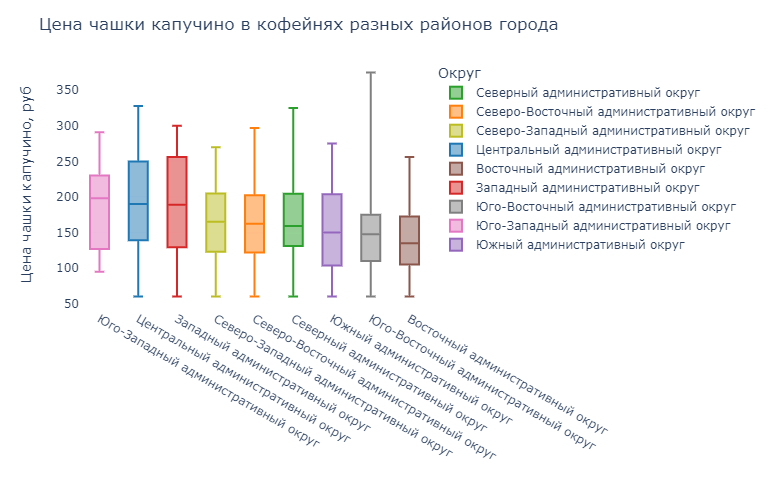

In [111]:
fig = px.box(df.query('category == "кофейня"'), y='middle_coffee_cup', x='district', color='district',
            color_discrete_map={
        'Центральный административный округ': '#1f77b4',
        'Северный административный округ': '#2ca02c',
        'Северо-Восточный административный округ':'#ff7f0e',
        'Западный административный округ':'#d62728',
        'Южный административный округ':'#9467bd',
        'Восточный административный округ':'#8c564b',
        'Юго-Западный административный округ':'#e377c2',
        'Юго-Восточный административный округ':'#7f7f7f',
        'Северо-Западный административный округ':'#bcbd22'})
fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)",
                   "plot_bgcolor": "rgba(0, 0, 0, 0)"},
                   title='Цена чашки капучино в кофейнях разных районов города',
                   xaxis_title="", yaxis_title="Цена чашки капучино, руб",
                   width=1000, height=500,
                   legend = dict(title='Округ'))
fig.update_xaxes(categoryorder='array', categoryarray= ['Юго-Западный административный округ', 
                                                        'Центральный административный округ',
                                                        'Западный административный округ',
                                                        'Северо-Западный административный округ', 
                                                        'Северо-Восточный административный округ', 
                                                        'Северный административный округ',
                                                        'Южный административный округ', 
                                                        'Юго-Восточный административный округ',
                                                        'Восточный административный округ'])
fig.update_traces(boxpoints=False)
fig.show()

**Для более наглядной визуализации создадим таблицу с медианной стоимостью капучино по районам и построим хороплет:**

In [112]:
coffee_rating = df.query('category == "кофейня"').pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').sort_values(by='middle_coffee_cup', ascending=False)
coffee_rating = coffee_rating.reset_index()
coffee_rating

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [113]:
lat, lng = 55.751244, 37.618423
m = Map(location=[lat, lng], tiles='Cartodb Positron', zoom_start=10)
Choropleth(geo_data = borders,
          data = coffee_rating,
          columns = ['district', 'middle_coffee_cup'],
          key_on = 'feature.name',
          fill_color = 'Oranges',
          fill_opacity = 0.7,
          legend_name = 'Медианная стоимость чашки капучино по округам Москвы').add_to(m)
m

**Мединная стоимость чашки капучино в Москве 170 рублей. Однако в зависимости от района города эта стоимость несколько различается: так, дороже всего капучино обойдется в Центральном, Западном и Юго-Западном округах (190-200 рублей), несколько дешевле - в Южном, Северо-Западном, Северо-Восточном и Юго-Восточном окргуах (150-165 рублей), дешевле всего медианная чашка капучино стоит в Восточном административном округе - 135 рублей. При открытии кофейни стоит ориетироваться на медианную цену капучино в районе, где предполагается разместить заведение.**

In [114]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicated,street,is_24,distance,coffee_price_indicated
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False,улица Дыбенко,False,17.0,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица Дыбенко,False,16.0,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,Клязьминская улица,False,16.0,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица Маршала Федоренко,False,17.0,True
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False,Правобережная улица,False,18.0,False


## Общиие рекомендации по открытию кофейни

1. Кофейни входят в топ-3 типов заведений общественного питания Москвы поколичеству (1412 точек). Поэтому логично будет открывать кофейню в районе, где их количество еще не слишком велико и, следовательно, ниже конкуренция: такими районами являютя Северо-Западный, Юго-Западный и Юго-Восточный округа Москвы.
2. Чтобы цены в кофейне были доступными для среднего москвича, желательно открывать ее в том районе, где рейтинг цен невысок, ведь рейтинг цен отражает суммарные затарты на работу заведения, в т.ч. аренду, стоимость которой отличается от района к району. Среди перечисленных в п.1 районов, такими являются Северо-Западный и Юго-Восточный районы Москвы (медианная цена чашки кофе 159 и 148 рублей - ниже чем в среднем по Москве).
3. Кроме того, в Северо-Западном и Юго-Восточном районах Москвы крайне мало круглосуточных кофеен. Предоставление сервиса 24/7 может стать конкурентным преимуществом перед другими заведениями.
4. Если доступность цен в кофейне не является принципиальной для инвесторов - то можно рассмотреть в качестве  варианта Юго-Запад Москвы (здесь кофеен еще не слишком много - 6.8% от общего числа московских кофеен, но медианная чашка капучино уже существенно дороже чем на Северо-Западе и Юго-Востоке - 198 рублей). Это указывает на высокую стоимость аренды и других операционных расходов.
5. Рынок кофеен Москвы более чем на 50 процентов представлен сетевыми заведениями, у которых, за счет больших объемов закупок, операционные расходы в пересчете на одно заведение будут ниже, чем у единственной в своем роде кофейни. Это дает сетям преимущество. Кроме того, конкурировать с сетевыми заведениями сложнее, т.к. они хорошо узнаются клиентами. Размещение несетевого заведения поблизости с сетевым почти наверняка приведет к тому, что значительная часть потенциальных клиентов предпочтет второе. Поэтому можно рекомендовать в тех районах, про которые сказано выше, искать места, где не будет нежелательного соседства с крупной сетью кофеен и/или кафе.
6. Если для инвесторов не является принципиальным неповторимый индивидуальный стиль кофейни, то можно рассмотреть вариант франчайзинга. Значительная доля успешных сетевых заведений Москвы работает по франчайзинговой модели. Это дает множество преимуществ - начиная с готовой модели ведения бизнеса и заканчивая хорошей узнаваемостью клиентами.   

## Презентация

**Ссылка на файл с презентацией:**
https://drive.google.com/file/d/1uzSVtqs0woYghSzAgQWGE9HqPuWr-I2I/view?usp=sharing